In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv')

In [56]:
df.to_csv('diabetes_git.csv')

In [4]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
pf = ProfileReport(df)
pf.to_widgets()

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:

df.BMI.replace(0, df['BMI'].mean(), inplace = True)

In [8]:
df.BloodPressure.replace(0, df['BloodPressure'].mean(), inplace=True)
df.Insulin.replace(0, df.Insulin.mean(), inplace=True)
df.Glucose.replace(0, df.Glucose.mean(), inplace=True)
df.SkinThickness.replace(0, df.SkinThickness.mean(), inplace=True)

In [9]:
pf2=ProfileReport(df)
pf2.to_widgets()

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

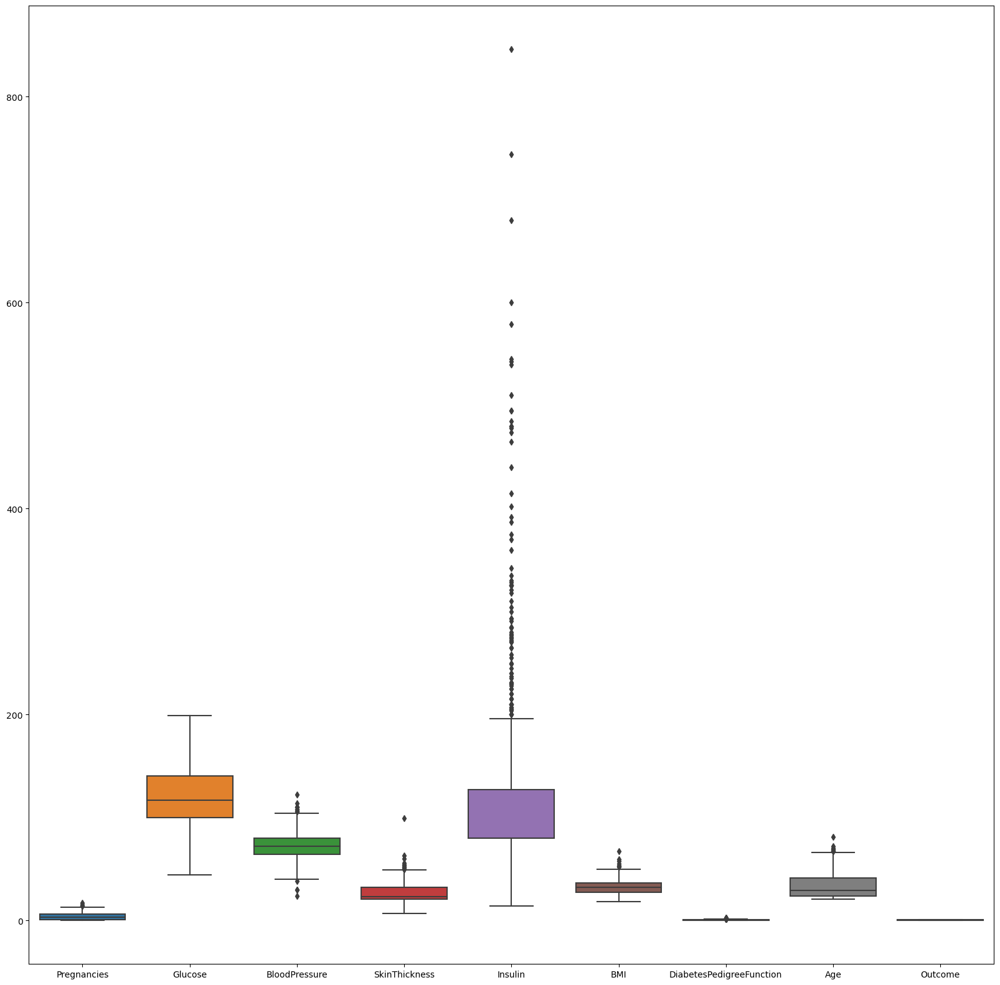

In [10]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data =df, ax=ax)
plt.show()

In [11]:
q = df['Pregnancies'].quantile(.98)
df_new = df[df['Pregnancies']<q]
q  = df['BMI'].quantile(.99)
df_new = df[df['BMI']<q]
q  = df['SkinThickness'].quantile(.99)
df_new = df[df['SkinThickness']<q]
q = df['Insulin'].quantile(.95)
df_new = df[df['Insulin']<q]
q = df['DiabetesPedigreeFunction'].quantile(.99)
df_new = df[df['DiabetesPedigreeFunction']<q]
q = df['Age'].quantile(.99)
df_new = df[df['Age']<q]
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


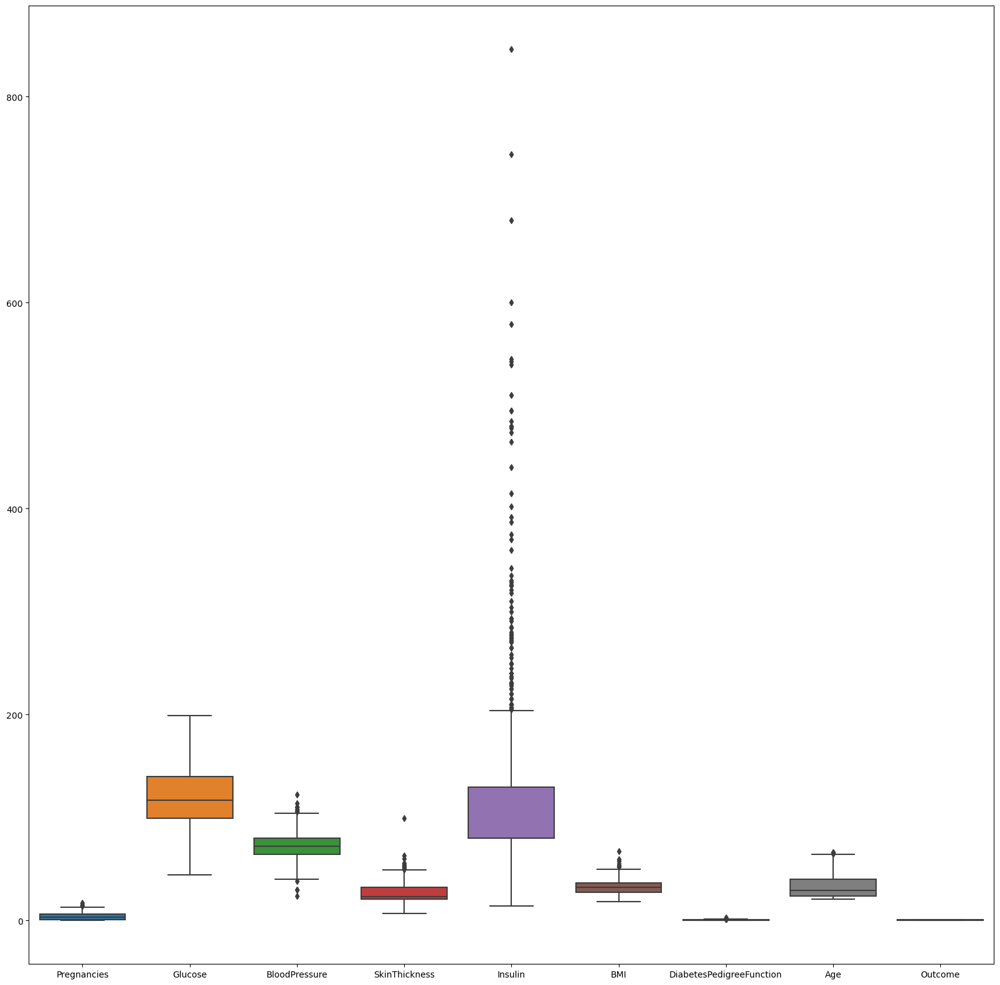

In [12]:
fig,ax = plt.subplots(figsize=(20,20))
sns.boxplot(data =df_new, ax=ax)
plt.show()

In [13]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
y = df_new['Outcome']
x = df_new.drop(columns = ['Outcome'])
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 759, dtype: int64

In [15]:
scaler = StandardScaler()
ProfileReport(pd.DataFrame(scaler.fit_transform(df_new)))


Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

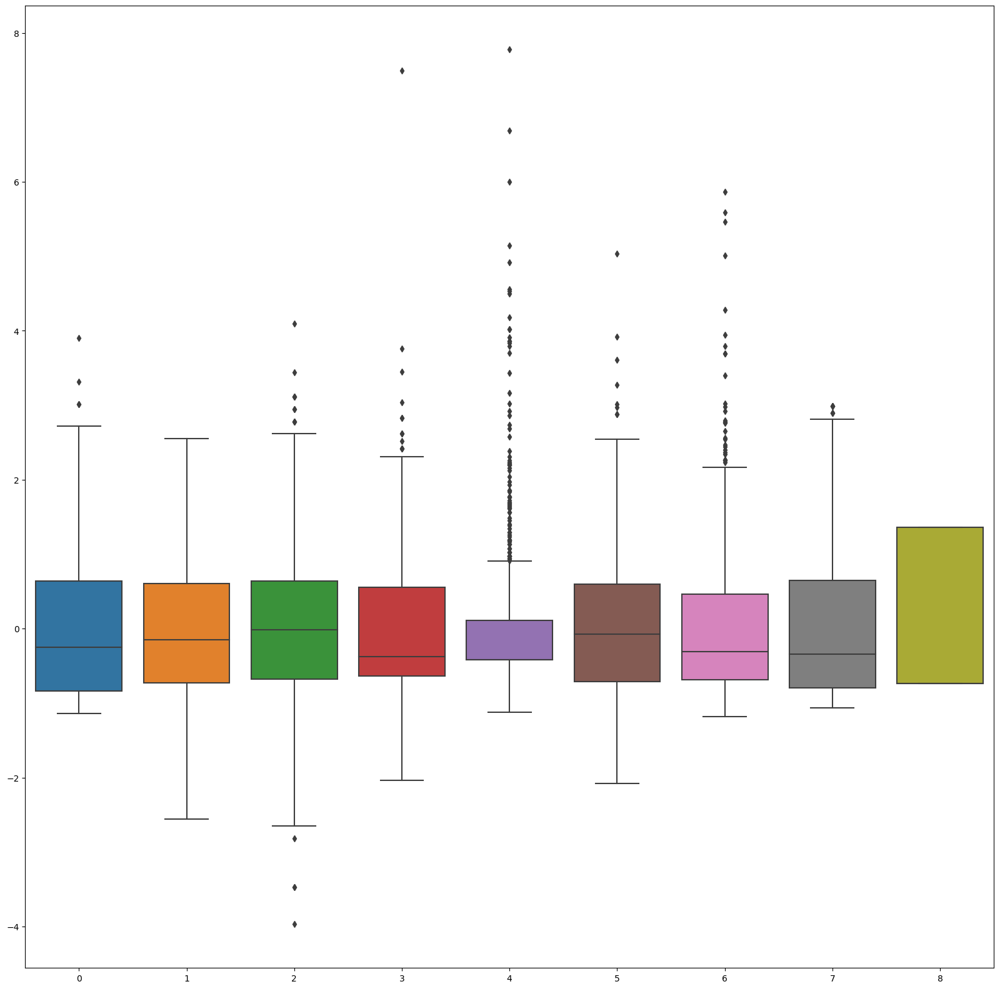

In [16]:
df_new_scaler = pd.DataFrame(scaler.fit_transform(df_new))
fig,ax = plt.subplots(figsize = (20,20))
sns.boxplot(data= df_new_scaler, ax=ax)
plt.show()

In [17]:
x_scaled = scaler.fit_transform(x)
x_scaled

array([[ 0.64327075,  0.87008298, -0.01698412, ...,  0.16090077,
         0.46879263,  1.54828125],
       [-0.83984741, -1.20656984, -0.51093456, ..., -0.85816238,
        -0.36177415, -0.16252742],
       [ 1.23651801,  2.02377899, -0.6755847 , ..., -1.33857787,
         0.60421113, -0.07248486],
       ...,
       [ 0.34664712, -0.01991109, -0.01698412, ..., -0.91639456,
        -0.68075995, -0.25256998],
       [-0.83984741,  0.14490263, -1.00488499, ..., -0.3486308 ,
        -0.36779275,  1.27815356],
       [-0.83984741, -0.9428679 , -0.18163427, ..., -0.30495667,
        -0.47010895, -0.88286791]])

In [18]:
y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 759, dtype: int64

In [19]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns = ['FEATURE', 'VIF_SCORE'])

In [20]:
vif_score(x)

,FEATURE,VIF_SCORE
0,Pregnancies,1.484572
1,Glucose,1.354580
2,BloodPressure,1.247898
3,SkinThickness,1.455095
4,Insulin,1.264776
5,BMI,1.551161
6,DiabetesPedigreeFunction,1.058847
7,Age,1.680199


In [21]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y ,test_size=0.20, random_state = 144)

In [42]:
logr_liblinear = LogisticRegression(verbose = 1, solver = 'liblinear')

In [29]:
logr.fit(x_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [30]:
logr.score(x_test, y_test)

0.75

In [32]:
logr.predict(x_test[[0]])

array([0], dtype=int64)

In [33]:
logr.predict_proba([x_test[0]])

array([[0.94265443, 0.05734557]])

In [34]:
logr.predict_log_proba([x_test[0]])

array([[-0.05905552, -2.85865975]])

In [35]:
x_test[0]

array([-0.24660015, -0.34953852, -0.84023485, -0.63470786, -0.42101423,
       -1.44048418, -0.99071784, -1.06295303])

In [41]:
y_test.iloc[0]

0

In [43]:
logr = LogisticRegression(verbose = 1)
logr.fit(x_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [47]:
logr_liblinear.fit(x_train, y_train)
y_pred_liblinear = logr_liblinear.predict(x_test)

[LibLinear]

In [48]:
y_pred_liblinear

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0],
      dtype=int64)

In [50]:
logr.fit(x_train , y_train)
y_pred_default = logr.predict(x_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


In [51]:
y_pred_default

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0],
      dtype=int64)

In [52]:
confusion_matrix(y_test, y_pred_liblinear)

array([[82, 12],
       [26, 32]], dtype=int64)

In [53]:
confusion_matrix(y_test, y_pred_default)

array([[82, 12],
       [26, 32]], dtype=int64)

In [55]:
# Both confusion matrix are same
def model_eval(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    precision = tp/(tp+fp)
    recall = tp/(tp+fn)
    specificity = tn/(tn+fp)
    f1_score = 2*(recall*precision)/(recall+precision)
    result = {"Accuracy":accuracy, "Precision":precision, "Recall":recall, "Specificity":specificity, "f1_score":f1_score}
    return result
model_eval(y_test, y_pred_liblinear)

{'Accuracy': 0.75,
 'Precision': 0.7272727272727273,
 'Recall': 0.5517241379310345,
 'Specificity': 0.8723404255319149,
 'f1_score': 0.6274509803921569}

In [60]:
auc = roc_auc_score(y_test, y_pred_liblinear)

In [61]:
roc_auc_score(y_test, y_pred_default)

0.7120322817314747

In [62]:
fpr, tpr, threshold = roc_curve(y_test, y_pred_liblinear)

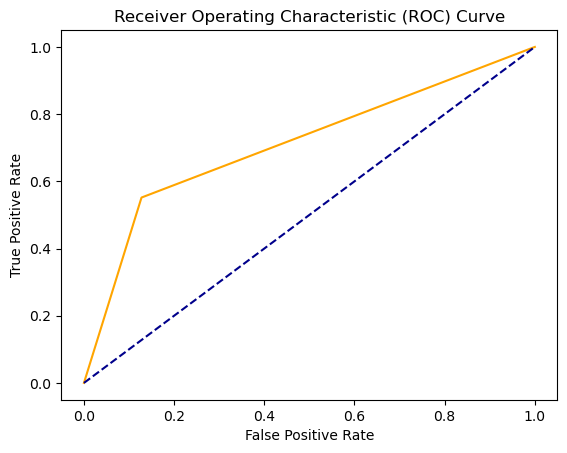

In [67]:
plt.plot(fpr, tpr, color= 'orange', label='ROC')
plt.plot([0,1],[0,1], color = 'darkblue', linestyle='--', label='ROC CURVE (area=%0.2f)' %auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()